In [1]:


import torch
import torch.nn as nn
import numpy as np
import pandas as pd

from torch.utils.data import Dataset

import pandas, random, numpy
import matplotlib.pyplot as plt

from PIL import Image, ImageOps


import glob
import PIL

from sklearn.model_selection import train_test_split


In [2]:

civs_path = 'data/imgs.new.CIVS'


In [3]:

path  = civs_path

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names

n_images = len(paths)

rand_idxs = np.random.permutation(n_images)

paths_subset = np.random.choice(paths, n_images , replace=False) 
all_paths    = paths_subset[rand_idxs]

print(n_images)


5016


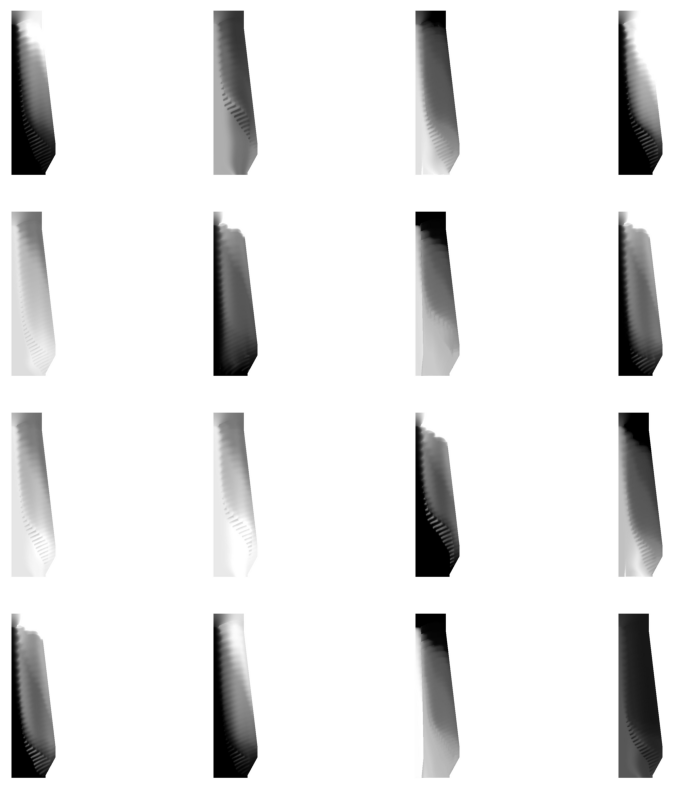

In [4]:

_, axes = plt.subplots(4, 4, figsize=(10, 10))

for ax, img_path in zip(axes.flatten(), all_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")


In [5]:

## data/imgs.new.CIVS/h2_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2o_Ng0_Pci150_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg

    
## ['tg', 'Ng0', 'Pci175', 'H0', 'Wp0', 'Ph300', 'Ox24', 'Ow7', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
    


In [6]:

'''

['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']
['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']


'''


"\n\n['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']\n['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n\n\n"

In [7]:

def label_func2(fname):
    ## print(fname)
    fname = fname.replace("data/imgs.new.CIVS/","")
    temp_name = fname.replace(".jpg", "").split("_")
    ## print(temp_name)
    
  
    y0 = temp_name[0]                              ## tg
    y1 = float(temp_name[1].replace("Ng", ""))     ## 'Ng0'
    y2 = float(temp_name[2].replace("Pci", ""))    ## 'Pci175'
    y3 = float(temp_name[3].replace("H", ""))     ## 'H0'
    y4 = float(temp_name[4].replace("Wp", ""))     ## 'Wp0'
    y5 = float(temp_name[5].replace("Ph", ""))     ## 'Ph300'
    y6 = float(temp_name[6].replace("Ox", ""))    ## 'Ox24'
    y7 = float(temp_name[7].replace("Ow", ""))     ## 'Ow7
    y8 = float(temp_name[8].replace("Hbt", ""))    ## 'Hbt1459.8'
    y9 = float(temp_name[9].replace("Wm", ""))    ## 'Wm12.2'
    y10 = float(temp_name[10].replace("Wr", ""))    ## 'Wr308750.4'
    
 
    ## np.array([y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ])
    return [fname, y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ]


In [8]:

## 1400, 390
## x 0.2
## 280 , 78
## 140, 39   ## for web tool
## 1400, 390  * 0.4 = 560, 156


list_imgs = []
list_label_vectors = []

for img_name in all_paths:
    ##print(img_name)
    
    my_img = Image.open(img_name)
    
    my_img = my_img.resize((156, 560))

    my_img = ImageOps.grayscale(my_img)

    img_np = np.array(my_img)
    
    ## data = np.array(my_img)
    ## print(data)
    ## input()

    ## img_np = img_np.reshape(-1)
    
    temp_label_vector_rc = label_func2(img_name)
    if temp_label_vector_rc[1] == "tg":
    
        ## print(img_np.shape)
        list_imgs.append(img_np)

        list_label_vectors.append( temp_label_vector_rc )


In [9]:

X =  list_imgs
y =  list_label_vectors 


In [10]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

#######################################################

print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))


668
168
668
168


In [11]:

X_train[0]


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [12]:

list_ids_train      = []
list_features_train = []
list_imgs_train     = []


for index in range(len(X_train)):
    
    # image target (label)
    reg_vals = y_train[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_train[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
    

        
    list_ids_train.append(          reg_vals[0]                )
    list_imgs_train.append(        single_np_img               )
    list_features_train.append(    target      )


In [13]:

list_imgs_train[0]


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [14]:


list_ids_test      = []
list_features_test = []
list_imgs_test     = []


for index in range(len(X_test)):
    
    # image target (label)
    reg_vals = y_test[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_test[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
        
    list_ids_test.append(          reg_vals[0]                )
    list_imgs_test.append(        single_np_img               )
    list_features_test.append(    target      )




In [15]:

conditions_matrix_train = np.array( list_features_train )
conditions_matrix_test  = np.array( list_features_test )


In [16]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


(668, 10)
(168, 10)



## Save data for deployment


In [17]:


DF_conditions_train = pd.DataFrame(conditions_matrix_train)
DF_conditions_train.to_csv("PD_conditions_train.csv")


In [18]:

DF_ids_train = pd.DataFrame(list_ids_train)
DF_ids_train.to_csv("PD_ids_train.csv")


In [19]:

list_imgs_train[17]
    


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [20]:

list_imgs_train[17].shape


(560, 156)

In [21]:

list_imgs_train_stretched = [     the_img_np.reshape(-1)         for the_img_np in list_imgs_train]


In [22]:

list_imgs_train_stretched[0]


array([255, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [23]:

list_imgs_train_stretched[4].shape


(87360,)

In [24]:

list_imgs_train_stretched[4][:1000]


array([255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 25

In [25]:

list_imgs_train_stretched[7].shape


(87360,)


## Keeps scale at 0..255


In [26]:

np_list_imgs_train_stretched = np.array( list_imgs_train_stretched )  


In [27]:

np_list_imgs_train_stretched.shape


(668, 87360)

In [28]:

np_list_imgs_train_stretched[3]


array([255, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [29]:

DF_imgs_np_train = pd.DataFrame(np_list_imgs_train_stretched)


In [30]:

DF_imgs_np_train


,0,1,2,3,4,5,6,7,8,9,...,87350,87351,87352,87353,87354,87355,87356,87357,87358,87359
0,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
663,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
664,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
665,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
666,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


In [31]:

DF_imgs_np_train.to_csv("PD_imgs_np_train.csv")



## Break up data for GitHub


In [32]:


# read DataFrame
break_up_data = pd.read_csv("PD_imgs_np_train.csv")
 
# no of csv files with row size
k = 9     ## k csv's
size = 75  ## n rows
 
for i in range(k):
    df = break_up_data[size*i:size*(i+1)]
    df.to_csv(f'Imgs_Furnace_{i+1}.csv', index=False)
 



## KNN part


In [33]:

def euclidean_distance(v1, v2):
    return np.sqrt( np.sum(   (v1 - v2)**2   )   )


In [34]:

def predict(test_x):
    
    ## calculate distances between test_x and all dta samples in x
    ## this distances vector is a vector of 45 distances
    ## distances = [ euclidean_distance(test_x , x)  for x in X_train    ]

    distances = [ euclidean_distance(test_x, x )  for x in conditions_matrix_train   ]
      
    
    ## distances - > [23, 3, 145, 17, ...]
    
    k = 3
    
    ## sort by distance value and return the k nearest neighbors
    ## np.argsort returns the indices of the k neares neighbors
    k_neighbor_indices = np.argsort(distances)[:k]
    print(k_neighbor_indices)
    
    
    ## with indices, extract labels from y_train 
    img_names = [ list_ids_train[i]  for i in k_neighbor_indices  ]
    ## imagine labels = [ 1, 1, 2, 0, 1]
    
    ## from labels, select the most common label
    ## most_common_label = Counter(labels).most_common(1)
    
    return img_names
    


In [35]:

def generate_img_per_index(index):
    
    res = predict( conditions_matrix_test[  index  ] )
    the_test_conditions = conditions_matrix_test[  index  ]
    print(res)
      
    selected_imgs_to_avg = []

    for img_name in res:
        img_name = "data/imgs.new.CIVS/" + img_name
        my_img = Image.open(img_name)
        my_img = my_img.resize((156, 560))
        my_img = ImageOps.grayscale(my_img)
        img_np = np.array(my_img)
       
        
        ## img_np = img_np.reshape(-1)
        selected_imgs_to_avg.append(img_np)
    avg_gen_img = np.mean( np.array(selected_imgs_to_avg), axis=0 )
    print(avg_gen_img.shape)
    print(avg_gen_img)
    gen_pil_image  = Image.fromarray(avg_gen_img).convert('L')
    print(gen_pil_image)
    
    real_my_img = np.array(list_imgs_test[index])
    real_pil_image = Image.fromarray(real_my_img)
    real_pil_image = ImageOps.grayscale(real_pil_image)
    
    print(gen_pil_image)
    print(real_pil_image)
    
    return the_test_conditions, gen_pil_image, real_pil_image
    



## Inference


(668, 10)
(168, 10)
[630 336 350]
['tg_Ng0_Pci70_H0_Wp0_Ph300_Ox27_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci70_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci70_H0_Wp0_Ph300_Ox27_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8E137B150>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8E137B150>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8E137B190>
0,70,0,0,300,27,6,1459,12,308750


Text(0.5, 1.0, 'real')

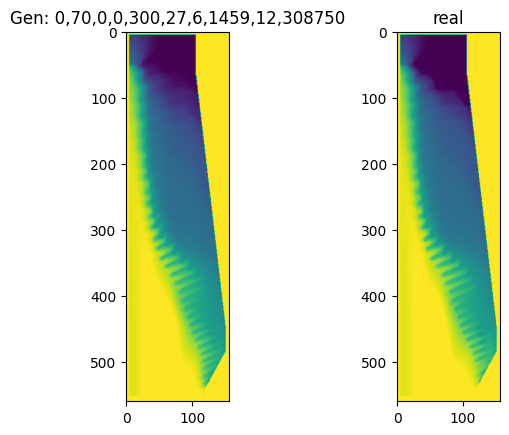

In [36]:



print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )

the_test_conditions, gen_pil_image, real_pil_image = generate_img_per_index(17)


the_test_conditions = the_test_conditions.astype(int)
str_conditions = np.array2string(the_test_conditions, precision=0, separator=',', suppress_small=True)
str_conditions = str_conditions.replace(" ","")
str_conditions = str_conditions.replace("[","")
str_conditions = str_conditions.replace("]","")

print(str_conditions)
                 

fig, ax = plt.subplots(1,2)

ax[0].imshow(gen_pil_image)
ax[1].imshow(real_pil_image)

ax[0].set_title("Gen: " + str_conditions)
ax[1].set_title("real")




(668, 10)
(168, 10)
[ 77 230 581]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow4.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE9362EA210>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE9362EA210>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE9535C1850>
[452 511 551]
['tg_Ng0_Pci124_H0_Wp0_Ph300_Ox30_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci124_H0_Wp0_Ph300_Ox30_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci124_H0_Wp0_Ph300_Ox27_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. 

[151 464  89]
['tg_Ng0_Pci90_H0_Wp0_Ph300_Ox27_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci90_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci90_H0_Wp0_Ph300_Ox24_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE936718B50>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE936718B50>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B8A42ED0>
[390 647 536]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox27_Ow4.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox27_Ow5.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox24_Ow3.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ..

/Users/user/opt/anaconda3/envs/py37_new_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


[611 279 316]
['tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow6.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow8.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow5.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B82B5550>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B82B5550>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B82B5490>
[  5 450 205]
['tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 25

(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B8686BD0>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B8686BD0>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE93600DD10>
[610 140 282]
['tg_Ng0_Pci70_H0_Wp0_Ph300_Ox24_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci70_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci70_H0_Wp0_Ph300_Ox21_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE945659850>
<PIL.Image.Image image mode=L size=156x560 at 0x7

(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE9104C6F10>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE9104C6F10>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B8DB85D0>
[226 224 365]
['tg_Ng20_Pci80_H0_Wp0_Ph300_Ox23_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng20_Pci80_H0_Wp0_Ph300_Ox23_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng20_Pci80_H0_Wp0_Ph300_Ox23_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE945ADD7D0>
<PIL.Image.Image image mode=L size=156x560 at 

(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A3106790>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A3106790>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE91072B8D0>
[415 585 301]
['tg_Ng0_Pci175_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox21_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox21_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE9106D28D0>
<PIL.Image.Image image mode=L size=156x560 at 

[275 268 485]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox30_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox27_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B99E4990>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B99E4990>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8B99E4A50>
[664 296 206]
['tg_Ng0_Pci38_H0_Wp0_Ph300_Ox27_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox27_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ..

[240 144 644]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox24_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox24_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A3ECDE10>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A3ECDE10>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE9364A7710>
[569 349  20]
['tg_Ng60_Pci40_H0_Wp0_Ph300_Ox23_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng60_Pci40_H0_Wp0_Ph300_Ox23_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng60_Pci40_H0_Wp0_Ph300_Ox23_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]


[400 297 119]
['tg_Ng0_Pci200_H0_Wp0_Ph300_Ox30_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci200_H0_Wp0_Ph300_Ox30_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci200_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A11E0F50>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A11E0F50>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A1144C50>
[609 543 105]
['tg_Ng120_Pci0_H0_Wp0_Ph300_Ox27_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox27_Ow4.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox27_Ow7.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255

[150 293 642]
['tg_Ng30_Pci20_H0_Wp0_Ph300_Ox21_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng20_Pci30_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng40_Pci10_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A0B85750>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8A0B85750>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE936BD2D90>
[305 659 219]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox30_Ow7.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox27_Ow5.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox30_Ow8.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255

[633 645  27]
['tg_Ng150_Pci0_H0_Wp0_Ph500_Ox24_Ow6.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph500_Ox24_Ow8.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph500_Ox24_Ow5.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE91151FAD0>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE91151FAD0>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE945D234D0>
[324 281 360]
['tg_Ng37.9_Pci0_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph300_Ox24_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255.

[389  69 408]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox24_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=156x560 at 0x7FE93114AD10>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE93114AD10>
<PIL.Image.Image image mode=L size=156x560 at 0x7FE8BAF21B50>
[  5 450 205]
['tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci30_H0_Wp0_Ph300_Ox25_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(560, 156)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255

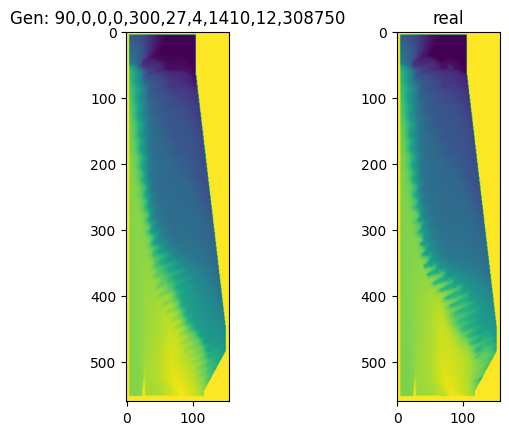

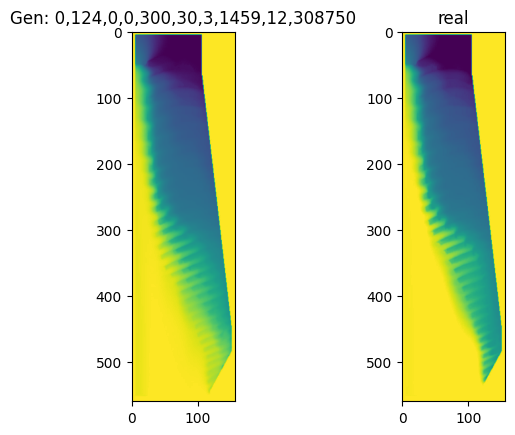

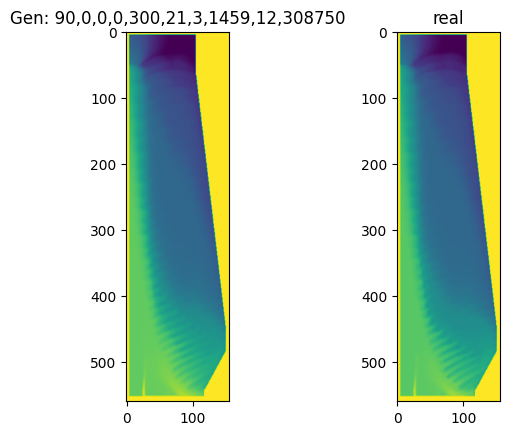

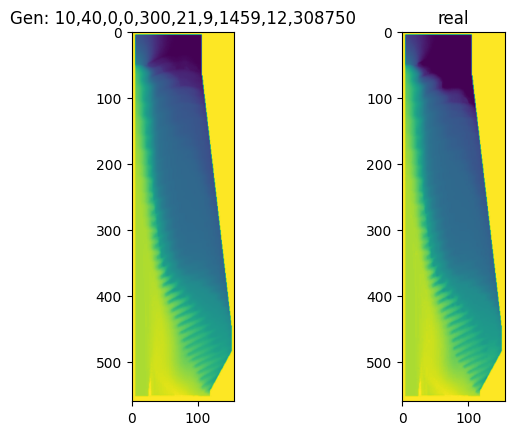

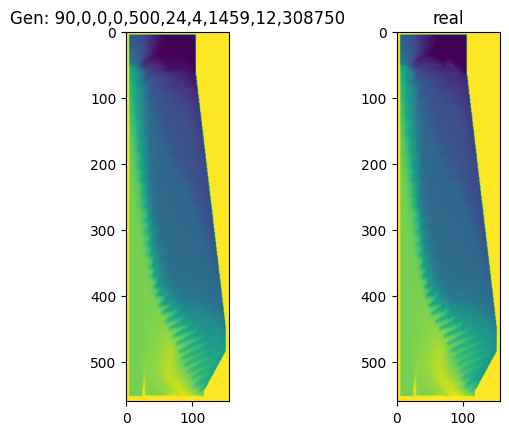

...

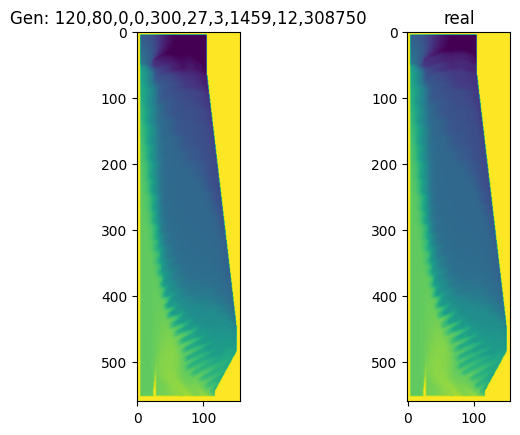

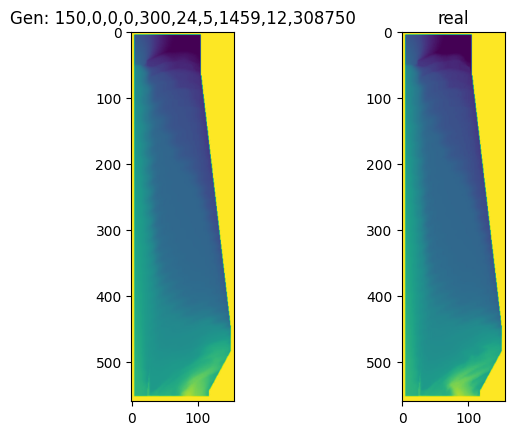

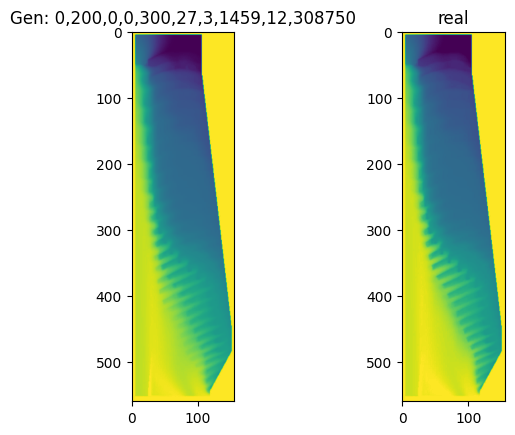

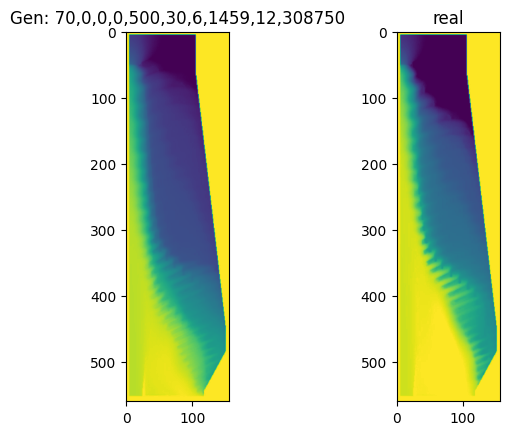

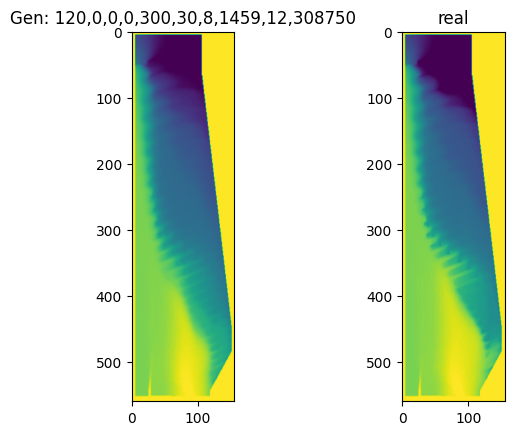

In [37]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


for test_i in range( conditions_matrix_test.shape[0]  ):

    the_test_conditions, gen_pil_image, real_pil_image = generate_img_per_index(test_i)
    
    the_test_conditions = the_test_conditions.astype(int)
    str_conditions = np.array2string(the_test_conditions, precision=0, separator=',', suppress_small=True)
    str_conditions = str_conditions.replace(" ","")
    str_conditions = str_conditions.replace("[","")
    str_conditions = str_conditions.replace("]","")

    ## print(str_conditions)

    fig, ax = plt.subplots(1,2)
    ax[0].imshow(gen_pil_image)
    ax[1].imshow(real_pil_image)
    
    ax[0].set_title("Gen: " + str_conditions)
    ax[1].set_title("real")
